In [1]:
pip install librosa soundfile numpy sklearn pyaudio

  Using cached sklearn-0.0.post5.tar.gz (3.7 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 164.1/164.1 kB 1.6 MB/s eta 0:00:00
  Created wheel for sklearn: filename=sklearn-0.0.post5-py3-none-any.whl size=2951 sha256=1f5d550bbd71267ac60c94e55c3df34a03ad98dc17015fd82e9f59945754b79e
  Stored in directory: c:\users\acer pc\appdata\local\pip\cache\wheels\36\49\c9\2374f1dee1b599effabf63d948635e6608f62d0ccde027b7e2
Successfully built sklearn
Note: you may need to restart the kernel to use updated packages.


In [2]:
import librosa
import soundfile
import os, glob, pickle
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score

In [3]:
pip install librosa

Note: you may need to restart the kernel to use updated packages.


Define a function extract_feature to extract the mfcc, chroma, and mel features from a sound file. This function takes 4 parameters- the file name and three Boolean parameters for the three features:

mfcc: Mel Frequency Cepstral Coefficient, represents the short-term power spectrum of a sound, simply are a way to represent the important features of a sound or speech signal.
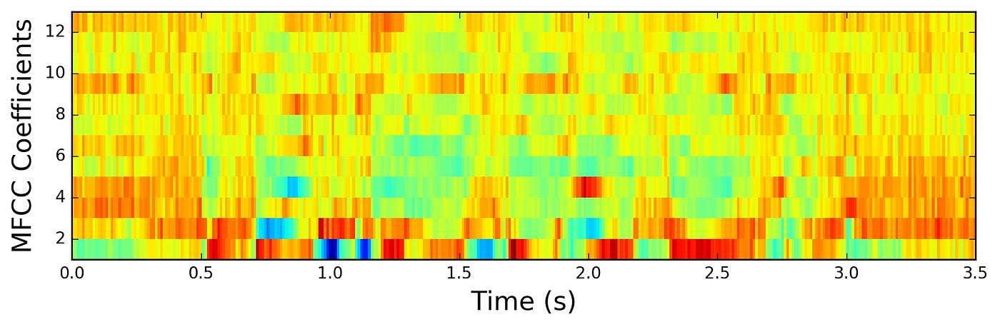


chroma: Pertains to the 12 different pitch classes- It provides a way to describe the musical "color" or "tonality" of a sound without getting into the details of individual notes.
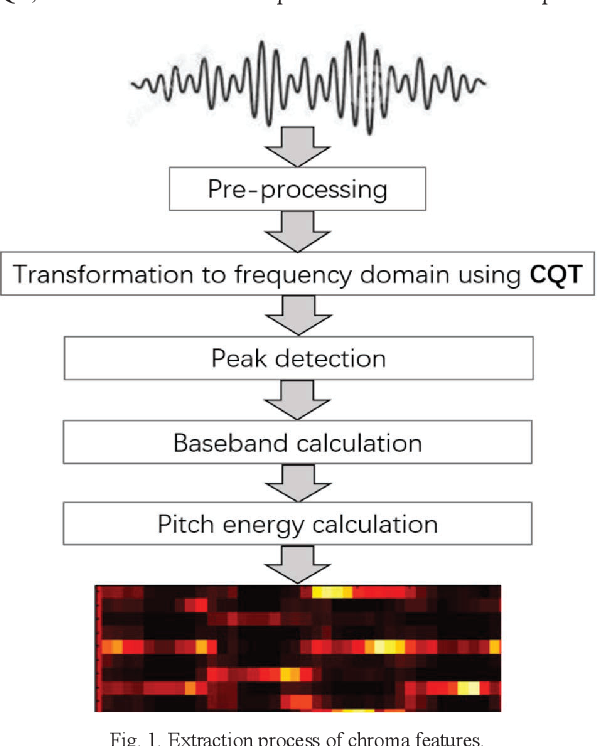



Mel spectrogram frequency refers to the frequency scale used in a mel spectrogram. A mel spectrogram is a visual representation of the spectral content of an audio signal, where the frequencies are transformed into the mel scale.

The mel scale is a perceptual scale that approximates the way humans perceive different frequencies. It is based on the observation that our perception of pitch is not linear with respect to the actual frequency of a sound.
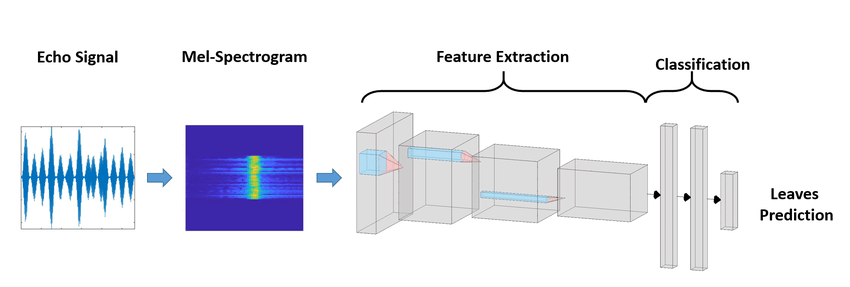

In [4]:
import soundfile
import numpy as np
import librosa

def extract_feature(file_name, mfcc, chroma, mel):
    with soundfile.SoundFile(file_name) as sound_file:
        X = sound_file.read(dtype="float32")
        sample_rate = sound_file.samplerate
        if chroma:
            stft = np.abs(librosa.stft(X))
        result = np.array([])
        if mfcc:
            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T, axis=0)
            result = np.hstack((result, mfccs))
        if chroma:
            chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
            result = np.hstack((result, chroma))
        if mel:
            mel = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T, axis=0)
            result = np.hstack((result, mel))
        return result


In [9]:
#DataFlair - Emotions in the RAVDESS dataset
emotions={
  '01':'neutral',
  '02':'calm',
  '03':'happy',
  '04':'sad',
  '05':'angry',
  '06':'fearful',
  '07':'disgust',
  '08':'surprised'
}

#DataFlair - Emotions to observe
observed_emotions=['calm', 'happy', 'fearful', 'disgust']

In [6]:
# Load the data and extract features
def load_data(test_size=0.2):
    x, y = [], []
    for file in glob.glob("E:/speech-emotion-recognition-ravdess-data/Actor_*/*.wav"):
        file_name = os.path.basename(file)
        emotion = emotions[file_name.split("-")[2]]
        if emotion not in observed_emotions:
            continue
        feature = extract_feature(file, mfcc=True, chroma=True, mel=True)
        x.append(feature)
        y.append(emotion)
    return train_test_split(np.array(x), y, test_size=test_size, random_state=9)

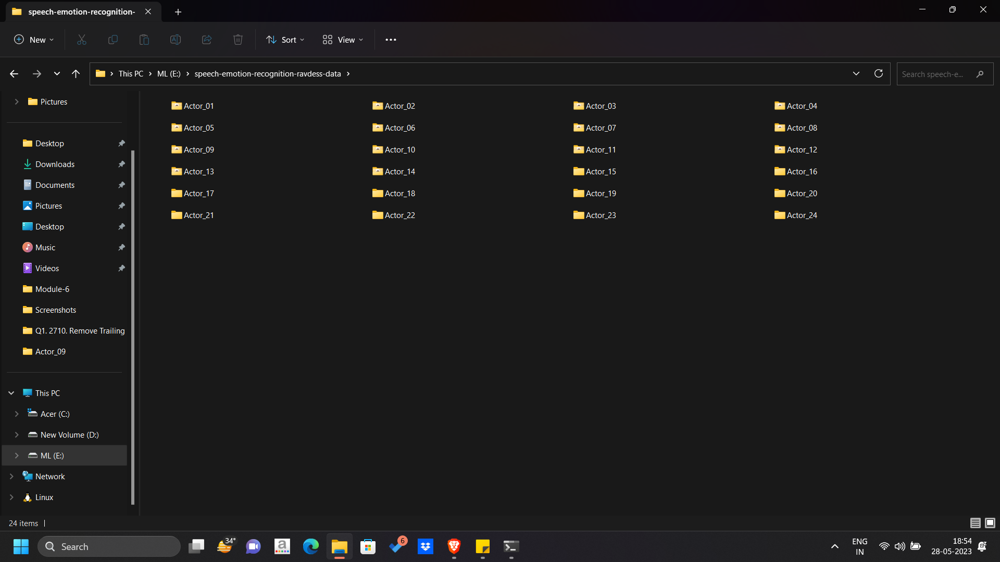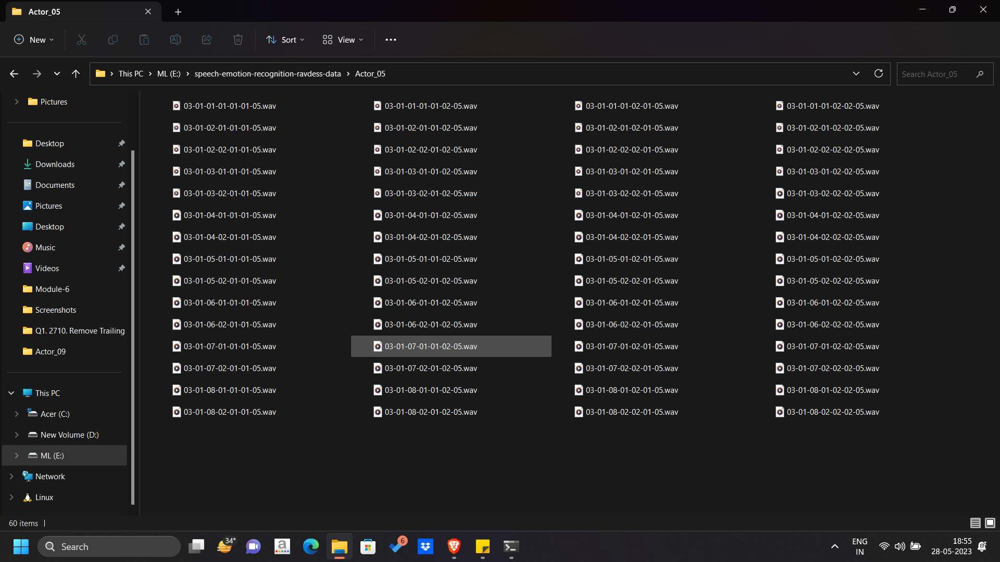

In [10]:
# Split the dataset
x_train, x_test, y_train, y_test = load_data(test_size=0.25)


In [11]:
x_train

array([[-5.22061890e+02,  3.50668907e+01,  3.75342965e+00, ...,
         1.65243153e-04,  1.04321596e-04,  6.55571566e-05],
       [-6.41227722e+02,  4.49487762e+01, -1.85174119e+00, ...,
         3.89261913e-05,  3.05255380e-05,  2.94166657e-05],
       [-6.50705750e+02,  5.30211639e+01, -4.92040443e+00, ...,
         4.75216802e-05,  3.46632514e-05,  1.62844426e-05],
       ...,
       [-5.50096191e+02,  1.70297680e+01, -1.14575634e+01, ...,
         1.51764631e-04,  1.16828531e-04,  8.47479314e-05],
       [-5.55357605e+02,  4.71569710e+01,  1.10750742e+01, ...,
         1.61086457e-04,  1.04962470e-04,  6.52811723e-05],
       [-5.04816345e+02,  3.53618660e+01, -1.43495789e+01, ...,
         6.08151488e-04,  5.55269769e-04,  4.47782222e-04]])

In [12]:
x_test

array([[-6.01385986e+02,  6.33781929e+01, -1.15760441e+01, ...,
         7.30556349e-06,  4.64438199e-06,  1.78243295e-06],
       [-7.86435913e+02,  5.99123268e+01,  2.08771191e+01, ...,
         4.30930726e-07,  4.01358051e-07,  4.06331111e-07],
       [-5.60618164e+02,  5.78945961e+01, -8.87167645e+00, ...,
         6.46989676e-04,  3.31015413e-04,  1.85833647e-04],
       ...,
       [-4.44762360e+02,  2.36132107e+01, -1.48354664e+01, ...,
         8.65290698e-04,  5.16015454e-04,  3.73600284e-04],
       [-5.96042603e+02,  6.76807480e+01,  1.72730601e+00, ...,
         2.92376499e-05,  2.20639486e-05,  1.13877441e-05],
       [-6.95510803e+02,  4.46803741e+01, -7.45934153e+00, ...,
         2.15333712e-05,  1.84784367e-05,  1.01300357e-05]])

In [13]:
y_train


['disgust',
 'fearful',
 'calm',
 'calm',
 'fearful',
 'fearful',
 'disgust',
 'calm',
 'calm',
 'happy',
 'calm',
 'disgust',
 'fearful',
 'disgust',
 'fearful',
 'disgust',
 'happy',
 'disgust',
 'fearful',
 'happy',
 'happy',
 'calm',
 'fearful',
 'disgust',
 'calm',
 'fearful',
 'disgust',
 'fearful',
 'calm',
 'calm',
 'happy',
 'fearful',
 'calm',
 'happy',
 'fearful',
 'calm',
 'fearful',
 'disgust',
 'calm',
 'disgust',
 'happy',
 'fearful',
 'happy',
 'fearful',
 'calm',
 'happy',
 'happy',
 'calm',
 'fearful',
 'disgust',
 'disgust',
 'disgust',
 'calm',
 'happy',
 'calm',
 'calm',
 'calm',
 'disgust',
 'happy',
 'disgust',
 'happy',
 'fearful',
 'happy',
 'disgust',
 'happy',
 'fearful',
 'calm',
 'happy',
 'calm',
 'happy',
 'disgust',
 'fearful',
 'calm',
 'calm',
 'happy',
 'fearful',
 'calm',
 'calm',
 'happy',
 'fearful',
 'happy',
 'calm',
 'happy',
 'fearful',
 'happy',
 'disgust',
 'disgust',
 'fearful',
 'fearful',
 'disgust',
 'disgust',
 'fearful',
 'calm',
 'calm

In [14]:
unique_values = set(y_train)
print(unique_values)

{'fearful', 'disgust', 'calm', 'happy'}


In [15]:
y_test

['happy',
 'calm',
 'happy',
 'happy',
 'disgust',
 'calm',
 'happy',
 'happy',
 'disgust',
 'happy',
 'happy',
 'disgust',
 'happy',
 'happy',
 'disgust',
 'fearful',
 'calm',
 'happy',
 'disgust',
 'disgust',
 'calm',
 'disgust',
 'disgust',
 'calm',
 'happy',
 'happy',
 'disgust',
 'disgust',
 'calm',
 'calm',
 'happy',
 'disgust',
 'happy',
 'fearful',
 'fearful',
 'calm',
 'calm',
 'fearful',
 'calm',
 'calm',
 'happy',
 'disgust',
 'calm',
 'calm',
 'disgust',
 'calm',
 'disgust',
 'happy',
 'calm',
 'happy',
 'fearful',
 'fearful',
 'fearful',
 'fearful',
 'happy',
 'fearful',
 'disgust',
 'happy',
 'calm',
 'calm',
 'disgust',
 'calm',
 'disgust',
 'calm',
 'disgust',
 'calm',
 'calm',
 'disgust',
 'disgust',
 'happy',
 'fearful',
 'fearful',
 'fearful',
 'fearful',
 'fearful',
 'disgust',
 'fearful',
 'happy',
 'calm',
 'fearful',
 'disgust',
 'calm',
 'happy',
 'calm',
 'disgust',
 'fearful',
 'calm',
 'happy',
 'disgust',
 'fearful',
 'disgust',
 'disgust',
 'calm',
 'fearfu

In [16]:
# Shapes of the splits
print(x_train.shape)
print(x_test.shape)
print(len(y_train))
print(len(y_test))

(576, 180)
(192, 180)
576
192


In [17]:
import os
import sounddevice as sd
import librosa

# Define a function to play audio
def play_audio(audio_path):
    audio_data, sample_rate = librosa.load(audio_path)
    sd.play(audio_data, sample_rate)
    sd.wait()

# Define the emotions dictionary
emotions = {
    '01': 'neutral',
    '02': 'calm',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

# Directory containing the audio files
directory = "E:/speech-emotion-recognition-ravdess-data"

# Iterate over the emotion categories and play the first audio file
for i in range(1, 25):
    emotion = emotions[str(i).zfill(2)]
    actor_directory = os.path.join(directory, f"Actor_{str(i).zfill(2)}")
    audio_files = os.listdir(actor_directory)
    audio_files.sort()
    first_audio = audio_files[0]
    audio_path = os.path.join(actor_directory, first_audio)
    
    print("Emotion:", emotion)
    play_audio(audio_path)
    input("Press Enter to continue...")


Emotion: neutral
Press Enter to continue...
Emotion: calm
Press Enter to continue...
Emotion: happy
Press Enter to continue...
Emotion: sad


KeyboardInterrupt: Interrupted by user

In [18]:
#DataFlair - Get the shape of the training and testing datasets
print((x_train.shape[0], x_test.shape[0]))

(576, 192)


In [19]:
#DataFlair - Get the number of features extracted
print(f'Features extracted: {x_train.shape[1]}')

Features extracted: 180


In [20]:
#DataFlair - Initialize the Multi Layer Perceptron Classifier
model=MLPClassifier(alpha=0.01, batch_size=256, epsilon=1e-08, hidden_layer_sizes=(300,), learning_rate='adaptive', max_iter=500)

In [21]:
#DataFlair - Train the model
model.fit(x_train,y_train)

MLPClassifier(alpha=0.01, batch_size=256, hidden_layer_sizes=(300,),
              learning_rate='adaptive', max_iter=500)

In [22]:
#DataFlair - Predict for the test set
y_pred=model.predict(x_test)

In [23]:
#DataFlair - Calculate the accuracy of our model
accuracy=accuracy_score(y_true=y_test, y_pred=y_pred)

#DataFlair - Print the accuracy
print("Accuracy: {:.2f}%".format(accuracy*100))

Accuracy: 65.10%


In [24]:
import joblib

# Save the model to a file
joblib.dump(model, 'model_file.pkl')


['model_file.pkl']

In [25]:
# Load the saved model from a file
loaded_model = joblib.load('model_file.pkl')


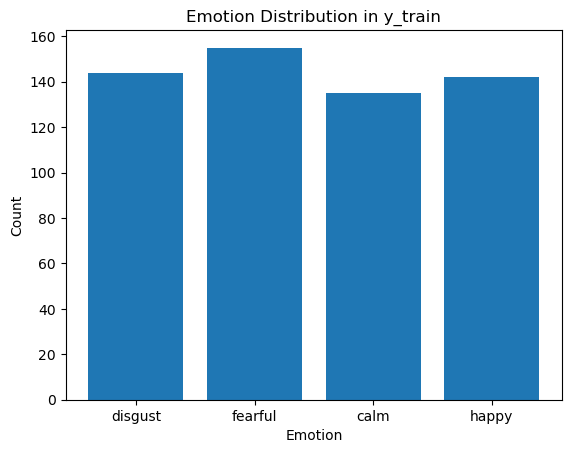

In [26]:
import matplotlib.pyplot as plt
from collections import Counter

# Count the occurrences of each emotion label
emotion_counts = Counter(y_train)

# Get the unique emotion labels
unique_emotions = list(emotion_counts.keys())

# Get the count of each emotion label
emotion_values = list(emotion_counts.values())

# Plot the emotion distribution
plt.bar(unique_emotions, emotion_values)
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.title('Emotion Distribution in y_train')
plt.show()


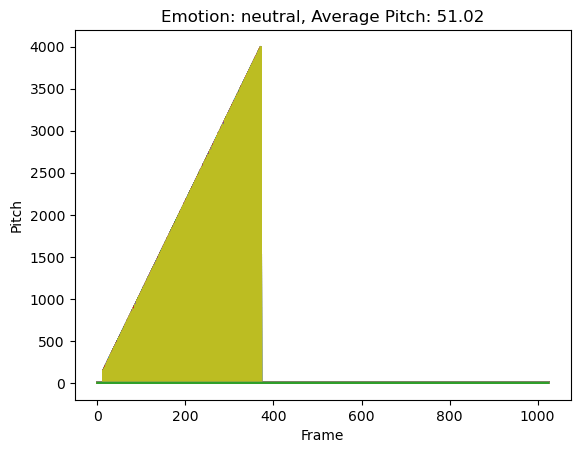

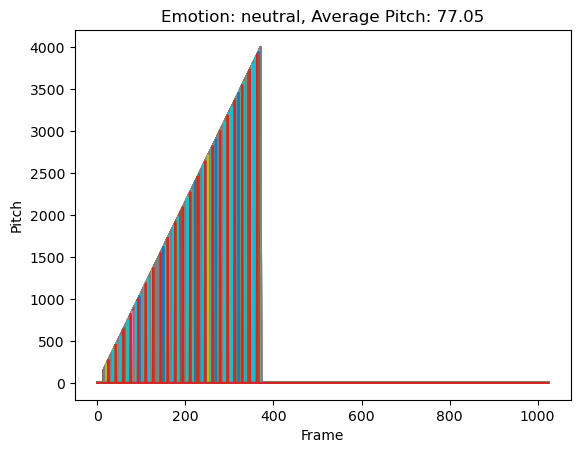

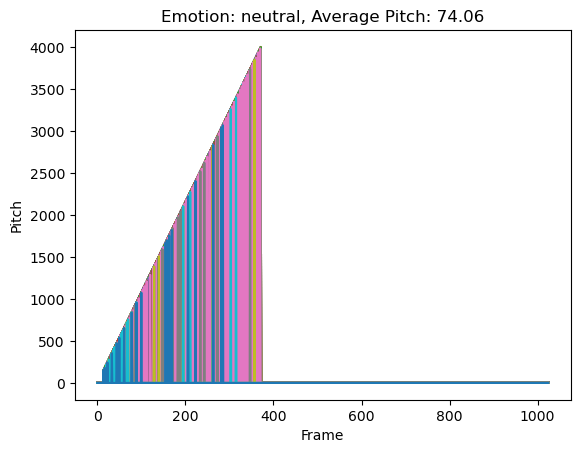

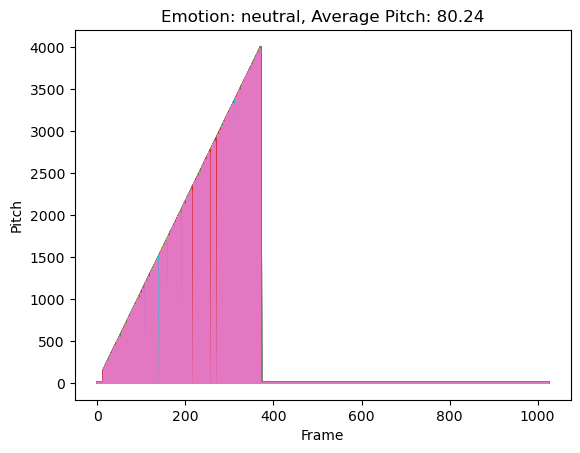

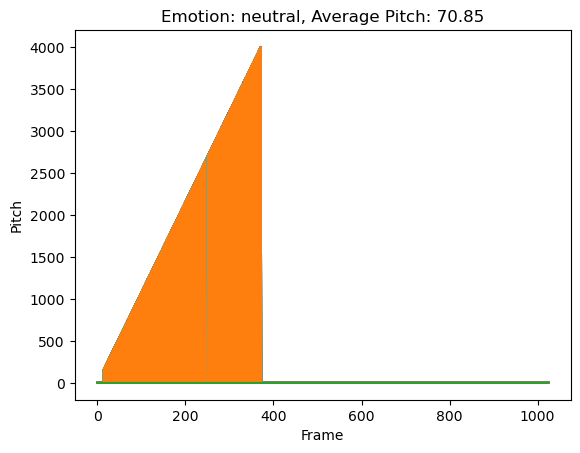

...

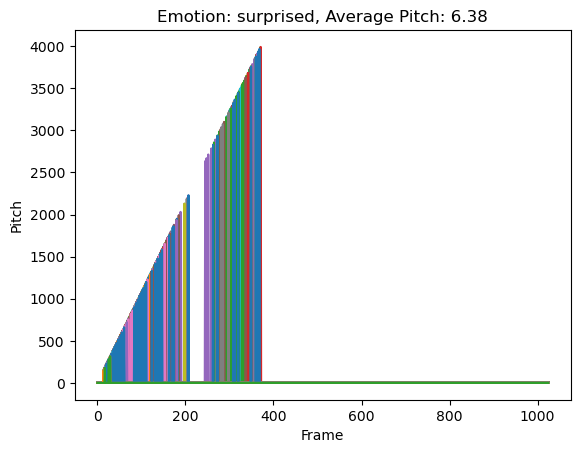

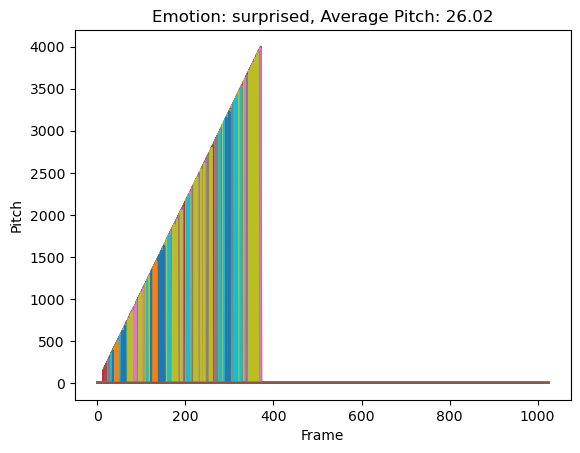

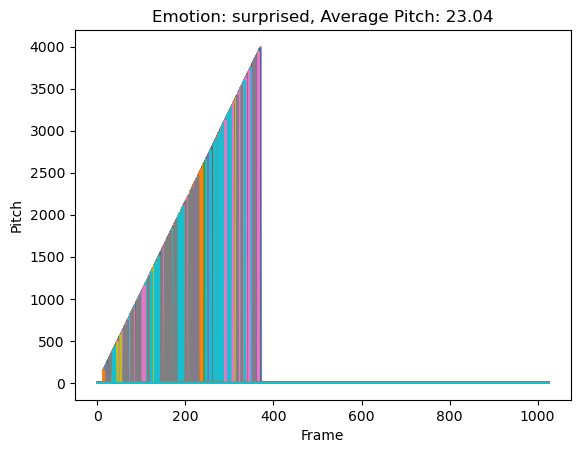

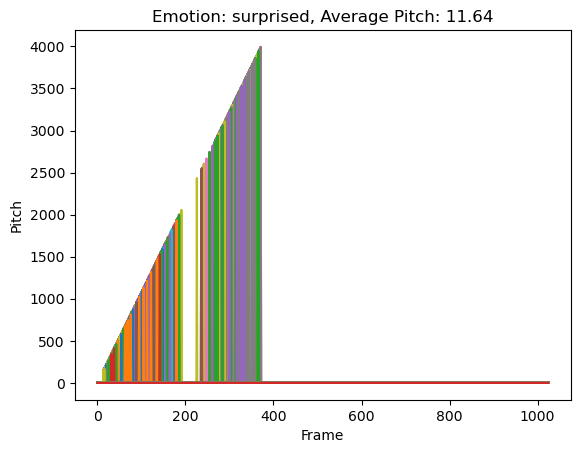

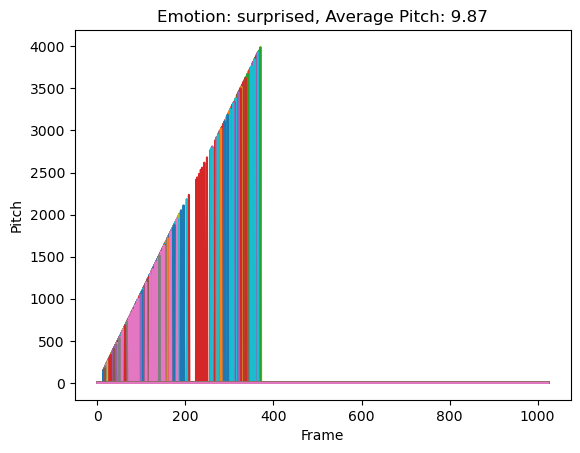

KeyError: '09'

In [29]:
import os
import glob
import librosa
import matplotlib.pyplot as plt

# Emotions in the RAVDESS 

emotions = {
    '01': 'neutral',
    '02': 'calm',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

# Directory containing the audio files
directory = "E:/speech-emotion-recognition-ravdess-data"

# Iterate over the emotion categories and plot the pitch for each voice
for i in range(1, 25):
    emotion = emotions[str(i).zfill(2)]
    actor_directory = os.path.join(directory, f"Actor_{str(i).zfill(2)}")
    audio_files = glob.glob(os.path.join(actor_directory, "*.wav"))
    
    for audio_file in audio_files:
        audio_data, sample_rate = librosa.load(audio_file)
        pitches, magnitudes = librosa.core.piptrack(y=audio_data, sr=sample_rate)
        average_pitch = np.mean(pitches)
        
        plt.figure()
        plt.plot(pitches)
        plt.title(f"Emotion: {emotion}, Average Pitch: {average_pitch:.2f}")
        plt.xlabel("Frame")
        plt.ylabel("Pitch")
        plt.show()


In [ ]:
import os
import glob
import librosa
from IPython.display import Audio, display

# Emotions in the RAVDESS dataset
emotions = {
    '01': 'neutral',
    '02': 'calm',
    '03': 'happy',
    '04': 'sad',
    '05': 'angry',
    '06': 'fearful',
    '07': 'disgust',
    '08': 'surprised'
}

# Directory containing the audio files
directory = "E:/speech-emotion-recognition-ravdess-data"

# Iterate over the emotion categories and play the first audio file from each actor
for i in range(1, 9):
    emotion = emotions[str(i).zfill(2)]
    actor_directory = os.path.join(directory, f"Actor_{str(i).zfill(2)}")
    audio_files = glob.glob(os.path.join(actor_directory, "*.wav"))
    
    if len(audio_files) > 0:
        audio_file = audio_files[0]
        audio_data, sample_rate = librosa.load(audio_file)
        
        print("Emotion:", emotion)
        display(Audio(audio_data, rate=sample_rate))
        input("Press Enter to continue...")
